In [ ]:
# ruff: noqa  # Expect this notebook to be of bad quality

import json
import os
import random
import zipfile

import librosa
import matplotlib.pyplot as plt
import pandas as pd
import soundfile as sf
from IPython.display import Audio, display

# Playground Notebook

Playground to work with wav files and create sample binaural mixes.

In [2]:
# os.chdir("/workspaces/misophonia-dataset/notebooks")
os.chdir("./notebooks")
foams_df = pd.read_csv("../data/metadata/segmentation_info.csv")

print("Number of mysophonia samples: ", foams_df.shape[0])
print("Unique classes: ", foams_df["label"].unique())
print("####################################################################################################")
foams_df.tail()

Number of mysophonia samples:  50
Unique classes:  ['basketball_dribbling' 'chewing_gum' 'clearing_throat'
 'flipping_newspaper' 'human_breathing' 'knife_cutting'
 'plastic_crumpling' 'swallowing' 'typing' 'water_drops']
####################################################################################################


,id,label,duration
45,324866,water_drops,4.074600
46,420221,water_drops,4.153793
47,486300,water_drops,4.176463
48,259326,water_drops,4.537254
49,181890,water_drops,4.570438


In [3]:
wav_zip_path = "data/FOAMS_processed_audio.zip"
foams_path = "../data/FOAMS_processed_audio/"

# unzip data
if not os.path.exists("../data/FOAMS_processed_audio"):
    print("Here we go again")
    zip_ref = zipfile.ZipFile(wav_zip_path, "r")
    zip_ref.extractall("./data")
    zip_ref.close()

In [4]:
# Read a sample
sample = foams_path + "87984_processed.wav"
sample_rate = 44100

Audio(sample, rate=sample_rate)

### Binaural Mixing

In [10]:
# Change working directory to Binamix
print("Before: ", os.getcwd())
binamix_dir = "/workspaces/misophonia-dataset/Binamix"
if os.getcwd() != binamix_dir:
    os.chdir("/workspaces/misophonia-dataset/Binamix")

print("After: ", os.getcwd())

from binamix.sadie_utilities import *

# import runpy
# from examples import binaural_mixer_example

# runpy.run_module("examples.binaural_mixer_example", run_name="__main__")

Before:  /workspaces/misophonia-dataset/Binamix
After:  /workspaces/misophonia-dataset/Binamix


In [11]:
if not os.path.exists("../data/busy_street_example.wav"):
    print("File already exists!")
    y, sr = librosa.load("../data/busy-street-traffic-309641.mp3", sr=44100)  # sr=None preserves original sample rate

    # Save as WAV
    sf.write("../data/busy_street_example.wav", y, sr)

In [12]:
busy_street_path = foams_path + "busy_street_example.wav"

Audio("../data/busy_street_example.wav", rate=sample_rate)

In [27]:
os.chdir("/workspaces/misophonia-dataset/")
foams_path = "data/FOAMS_processed_audio/"

data_path = "data"
subject_id = "D2"
ir_type = "HRIR"  # Options HRIR, BRIR
speaker_layout = "none"
sr = 44100

# Read in audio data
street, sr = librosa.load(f"{data_path}/busy_street_example.wav", sr=44100, mono=True, duration=5.097981)
basketball, sr = librosa.load(f"{foams_path}453757_processed.wav", sr=44100, mono=True, duration=5.097981)

# Create TrackObjects
track1 = TrackObject(name="street", azimuth=60, elevation=100, level=0.4, reverb=0.0, audio=street)
track2 = TrackObject(name="basketball", azimuth=300, elevation=0, level=0.8, reverb=0.0, audio=basketball)
tracks = [track1, track2]

# Make Right Ear Binaural Mix
output_right = mix_tracks_binaural(tracks, subject_id, sr, ir_type, speaker_layout, mode="auto", reverb_type="1")

Rendering Mix...
Mixing  street


Interpolation Mode: 'Auto'
The query point is outside the triangulation range. Trying 360 azimuth rotation...
The query point is still outside the triangulation range. Trying 180 elevation rotation...

Speaker Layout: none
Desired Angle: (60, 100)

Nearest angle p1: (60.0, 90.0) | Difference: 0.17
Nearest angle p2: (59.0, -81.0) | Difference: 2.00
Nearest angle p3: (60.0, -81.0) | Difference: 2.00

Checking Angle Options...
Angle difference to nearest actual angle -> (60.00, 90.00) Difference | 0.174
Interpolated Angle using 2pts [p1 & p2] -> (59.00, 89.15)  Difference | 0.189   Weights | 0.920 0.080
Interpolated Angle using 2pts [p1 & p3] -> (60.00, 89.15)  Difference | 0.189   Weights | 0.920 0.080
Interpolated Angle using 3pts [p1 p2 p3] -> (59.50, 88.11)  Difference | 0.207

Desired Angle: (60, 100)
Using 2 Point Interpolation to achieve cartesian angle estimate: (59.00, 89.15)
Angles used: (60.0, 90.0) (59.0, -81.0)
-----------------------------------
Mixing  basketball
Interpolat

In [28]:
# Create TrackObjects
track1 = TrackObject(name="street", azimuth=60, elevation=100, level=0.4, reverb=0.0, audio=street)
track2 = TrackObject(name="basketball", azimuth=30, elevation=0, level=0.8, reverb=0.0, audio=basketball)
tracks = [track1, track2]

# Make Left Ear Binaural Mix
output_left = mix_tracks_binaural(tracks, subject_id, sr, ir_type, speaker_layout, mode="auto", reverb_type="1")

Rendering Mix...
Mixing  street


Interpolation Mode: 'Auto'
The query point is outside the triangulation range. Trying 360 azimuth rotation...
The query point is still outside the triangulation range. Trying 180 elevation rotation...

Speaker Layout: none
Desired Angle: (60, 100)

Nearest angle p1: (60.0, 90.0) | Difference: 0.17
Nearest angle p2: (59.0, -81.0) | Difference: 2.00
Nearest angle p3: (60.0, -81.0) | Difference: 2.00

Checking Angle Options...
Angle difference to nearest actual angle -> (60.00, 90.00) Difference | 0.174
Interpolated Angle using 2pts [p1 & p2] -> (59.00, 89.15)  Difference | 0.189   Weights | 0.920 0.080
Interpolated Angle using 2pts [p1 & p3] -> (60.00, 89.15)  Difference | 0.189   Weights | 0.920 0.080
Interpolated Angle using 3pts [p1 p2 p3] -> (59.50, 88.11)  Difference | 0.207

Desired Angle: (60, 100)
Using 2 Point Interpolation to achieve cartesian angle estimate: (59.00, 89.15)
Angles used: (60.0, 90.0) (59.0, -81.0)
-----------------------------------
Mixing  basketball
Interpolat

#### Left Ear, Then Right

In [ ]:
Audio(data="data/FOAMS_processed_audio/453757_processed.wav", rate=41400)

In [29]:
Audio(output_left, rate=sr)

In [30]:
Audio(output_right, rate=sr)

# Extracting Sound Classes from Dataset Metadata

### FSDk50

In [5]:
# Change working directory to notebooks
print(os.getcwd())
os.chdir("./notebooks")

dev_path = "../data/metadata/FSD50K.metadata/collection/vocabulary_collection_dev.csv"
eval_path = "../data/metadata/FSD50K.metadata/collection/vocabulary_collection_eval.csv"

fsd50k_class_names = pd.read_csv(dev_path, header=None)[1].unique().tolist()
fsd50k_class_names.extend(pd.read_csv(eval_path, header=None)[1].unique().tolist())

fsd50k_class_names = sorted(list(set(fsd50k_class_names)))
fsd50k_class_names

/workspaces/misophonia-dataset


['Accelerating_and_revving_and_vroom',
 'Accordion',
 'Acoustic_guitar',
 'Air_conditioning',
 'Air_horn_and_truck_horn',
 'Aircraft',
 'Aircraft_engine',
 'Alarm',
 'Alarm_clock',
 'Alto_saxophone',
 'Ambulance_(siren)',
 'Animal',
 'Applause',
 'Arrow',
 'Artillery_fire',
 'Babbling',
 'Baby_cry_and_infant_cry',
 'Baby_laughter',
 'Bark',
 'Bass_drum',
 'Bass_guitar',
 'Bassoon',
 'Bathtub_(filling_or_washing)',
 'Battle_cry',
 'Bee_and_wasp_and_etc.',
 'Bell',
 'Belly_laugh',
 'Bicycle',
 'Bicycle_bell',
 'Bird',
 'Bird_flight_and_flapping_wings',
 'Bird_vocalization_and_bird_call_and_bird_song',
 'Biting',
 'Bleat',
 'Blender',
 'Boat_and_Water_vehicle',
 'Boiling',
 'Booing',
 'Boom',
 'Bowed_string_instrument',
 'Brass_instrument',
 'Breathing',
 'Burping_and_eructation',
 'Burst_and_pop',
 'Bus',
 'Busy_signal',
 'Buzz',
 'Buzzer',
 'Camera',
 'Cap_gun',
 'Car',
 'Car_alarm',
 'Car_passing_by',
 'Cash_register',
 'Cat',
 'Cat_communication',
 'Caterwaul',
 'Cattle_and_bovinae',


### ESC-50

In [4]:
file_path = "../data/metadata/esc50.csv"
esc50_class_names = pd.read_csv(file_path)["category"].unique().tolist()
esc50_class_names = sorted(list(set(esc50_class_names)))
esc50_class_names

['airplane',
 'breathing',
 'brushing_teeth',
 'can_opening',
 'car_horn',
 'cat',
 'chainsaw',
 'chirping_birds',
 'church_bells',
 'clapping',
 'clock_alarm',
 'clock_tick',
 'coughing',
 'cow',
 'crackling_fire',
 'crickets',
 'crow',
 'crying_baby',
 'dog',
 'door_wood_creaks',
 'door_wood_knock',
 'drinking_sipping',
 'engine',
 'fireworks',
 'footsteps',
 'frog',
 'glass_breaking',
 'hand_saw',
 'helicopter',
 'hen',
 'insects',
 'keyboard_typing',
 'laughing',
 'mouse_click',
 'pig',
 'pouring_water',
 'rain',
 'rooster',
 'sea_waves',
 'sheep',
 'siren',
 'sneezing',
 'snoring',
 'thunderstorm',
 'toilet_flush',
 'train',
 'vacuum_cleaner',
 'washing_machine',
 'water_drops',
 'wind']

### FOAMS Classes (Triggering and Non-Triggering)


In [12]:
dev_collection_path = "../data/metadata/FSD50K.metadata/collection/collection_dev.csv"

fsd_50k = pd.read_csv(dev_collection_path)
print(fsd_50k.shape[0])
fsd_50k.head()

40966


,fname,labels,mids
0,64760,Electric_guitar,/m/02sgy
1,16399,Electric_guitar,/m/02sgy
2,16401,Electric_guitar,/m/02sgy
3,16402,Electric_guitar,/m/02sgy
4,16404,Electric_guitar,/m/02sgy


In [17]:
fsd50k_to_foams = "../data/fsd50k_to_foams_mapping.json"

# Open json file and save all class names

with open(fsd50k_to_foams) as f:
    data = json.load(f)
    foams_trigger_classes = [k for k in data["Trigger"].keys()]

fsd_50k_triggers = fsd_50k[fsd_50k["labels"].isin(foams_trigger_classes)]
print("FSD unique classes", fsd_50k_triggers["labels"].unique())
print("Length of samples", fsd_50k_triggers.shape[0])
fsd_50k_triggers.head()

FSD unique classes ['Drip' 'Typewriter' 'Raindrop' 'Crumpling_and_crinkling'
 'Chewing_and_mastication' 'Breathing' 'Pant' 'Trickle_and_dribble'
 'Cough' 'Throat_clearing' 'Scissors' 'Computer_keyboard' 'Typing'
 'Gurgling' 'Crushing' 'Chopping_(food)']
Length of samples 1621


,fname,labels,mids
6356,177059,Drip,/m/07r5v4s
6357,178084,Drip,/m/07r5v4s
8895,204465,Typewriter,/m/0c2wf
8896,204466,Typewriter,/m/0c2wf
8902,201589,Typewriter,/m/0c2wf


In [14]:
esc50 = pd.read_csv("../data/metadata/esc50.csv")

esc50_to_foams = "../data/esc50_to_foams_mapping.json"

# Open json file and save all class names

with open(esc50_to_foams) as f:
    data = json.load(f)
    esc_trigger_classes = [k for k in data.keys()]

esc50_triggers = esc50[esc50["category"].isin(esc_trigger_classes)]
print("Trigger classes from ESC-50: ", esc_trigger_classes)
print("Number of new samples: ", esc50_triggers.shape[0])

Trigger classes from ESC-50:  ['breathing', 'coughing', 'keyboard_typing', 'water_drops', 'drinking_sipping']
Number of new samples:  200


In [9]:
if not os.path.exists("../data/ESC-50-master"):
    print("Extracting ESC-50 dataset...")
    zip_ref = zipfile.ZipFile("../data/ESC-50-master.zip", "r")
    zip_ref.extractall("../data")
    zip_ref.close()
    print("Extraction complete!")
else:
    print("ESC-50 dataset already extracted")

ESC-50 dataset already extracted


In [10]:
def sample_audio_file(file_path: str, class_name: str, meta_df: pd.DataFrame):
    class_samples = meta_df[meta_df["category"] == class_name]

    random.seed(10)
    row = random.choice(range(0, class_samples.shape[0]))

    audio_file = class_samples.iloc[row]["filename"]
    audio_path = file_path + audio_file

    display(Audio(audio_path))


# EESC50
file_path = "../data/ESC-50-master/audio/"
for c in esc_trigger_classes:
    sample_audio_file(file_path=file_path, class_name=c, meta_df=esc50_triggers)

## FSD50K Samples

In [ ]:
filepath = "../data/FSD50K.dev_audio/"


def sample_fsd_file(file_path: str, class_name: str, meta_df: pd.DataFrame):
    class_samples = meta_df[meta_df["labels"] == class_name]

    if class_samples.shape[0] == 0:
        print("No samples found for class: ", class_name)
        return

    random.seed(10)
    row = random.choice(range(0, class_samples.shape[0]))
    audio_file = class_samples.iloc[row]["fname"]
    audio_path = file_path + str(audio_file) + ".wav"

    display(Audio(audio_path, rate=44100))


for c in foams_trigger_classes:
    print(c)
    sample_fsd_file(file_path=filepath, class_name=c, meta_df=fsd_50k_triggers)

# Distribution of New Samples

C:\Users\terma\AppData\Local\Temp\ipykernel_24888\1481026373.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fsd_50k_triggers['labels'] = fsd_50k_triggers['labels'].apply(lambda x: data[str(x)]['foams_mapping'])


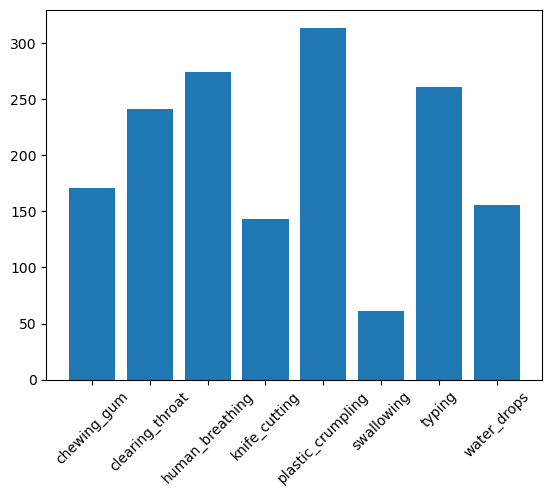

In [24]:
with open(fsd50k_to_foams) as f:
    data = json.load(f)
    fsd_50k_triggers["labels"] = fsd_50k_triggers["labels"].apply(lambda x: data[str(x)]["foams_mapping"])

label_counts = fsd_50k_triggers.groupby("labels").size().reset_index(name="counts")

_ = plt.bar(label_counts["labels"], height=label_counts["counts"])

_ = plt.xticks(rotation=45)

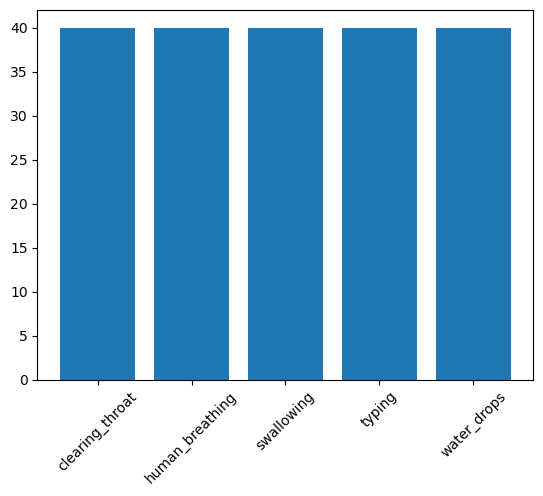

In [22]:
# with open(esc50_to_foams) as f:
#     data = json.load(f)
#     esc50_triggers['category'] = esc50_triggers['category'].apply(lambda x: data[str(x)]['foams_mapping'])


label_counts = esc50_triggers.groupby("category").size().reset_index(name="counts")
plt.bar(label_counts["category"], height=label_counts["counts"])
_ = plt.xticks(rotation=45)

In [30]:
sample_fsd_file(file_path="../data/FSD50K.dev_audio/", class_name="Rain", meta_df=fsd_50k)